In [ ]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('Cargar achivo de mi laptop "{name}" tamaño {length} en bytes'.format(
      name=fn, length=len(uploaded[fn])))


In [ ]:
import kagglehub

#path = kagglehub.dataset_download("kmader/food41")

print("Path to dataset files:", path)

100%|██████████| 5.30G/5.30G [01:01<00:00, 93.1MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/kmader/food41/versions/5


Dataset extraído en: /kaggle/input/food41
Found 90900 images belonging to 101 classes.
Found 10100 images belonging to 101 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
2841/2841 ━━━━━━━━━━━━━━━━━━━━ 521s 181ms/step - accuracy: 0.0098 - loss: 4.6157 - val_accuracy: 0.0099 - val_loss: 4.6152
Epoch 2/5
2841/2841 ━━━━━━━━━━━━━━━━━━━━ 310s 109ms/step - accuracy: 0.0088 - loss: 4.6156 - val_accuracy: 0.0099 - val_loss: 4.6152
Epoch 3/5
2841/2841 ━━━━━━━━━━━━━━━━━━━━ 313s 110ms/step - accuracy: 0.0094 - loss: 4.6156 - val_accuracy: 0.0099 - val_loss: 4.6152
Epoch 4/5
2841/2841 ━━━━━━━━━━━━━━━━━━━━ 317s 112ms/step - accuracy: 0.0097 - loss: 4.6156 - val_accuracy: 0.0099 - val_loss: 4.6152
Epoch 5/5
2841/2841 ━━━━━━━━━━━━━━━━━━━━ 312s 110ms/step - accuracy: 0.0099 - loss: 4.6156 - val_accuracy: 0.0099 - val_loss: 4.6152
316/316 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - accuracy: 0.0079 - loss: 4.6149
Precisión en validación (Sobel): 0.0099
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s

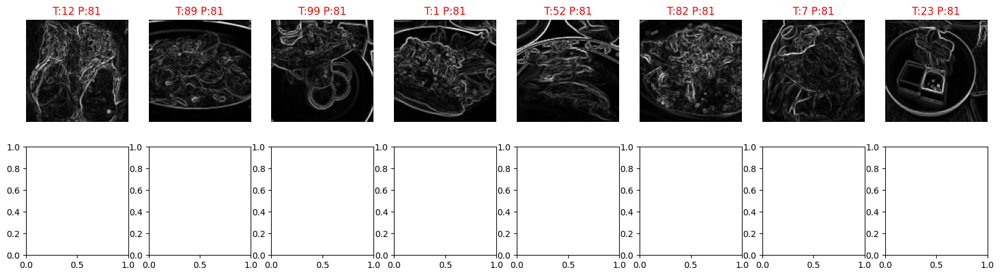

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2

from kagglehub import dataset_download
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models

#  Descargaremos y extraeremos el dataset de kaggle
dataset_path = dataset_download("kmader/food41")
print("Dataset extraído en:", dataset_path)


train_dir = os.path.join(dataset_path, "images")

#Definimos un filtro, en este caso ocupé Sobel (detección de bordes)
def sobel_filter(img):

    gray = (img * 255).astype("uint8")
    sx   = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    sy   = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    s    = np.sqrt(sx**2 + sy**2)
    return (s / np.max(s)).astype("float32")[..., np.newaxis]

# 4) Crear generadores con Sobel y split 90/10
datagen = ImageDataGenerator(
    rescale=1./255,
    preprocessing_function=sobel_filter,
    validation_split=0.1
)

train_gen = datagen.flow_from_directory(
    train_dir,
    target_size=(128,128),
    color_mode="grayscale",
    batch_size=32,
    class_mode="categorical",
    subset="training"
)
val_gen = datagen.flow_from_directory(
    train_dir,
    target_size=(128,128),
    color_mode="grayscale",
    batch_size=32,
    class_mode="categorical",
    subset="validation"
)

# Usamos la arquitectura CNN
model = models.Sequential([
    layers.Input((128,128,1)),
    layers.Conv2D(32, (3,3), activation="relu"),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64, (3,3), activation="relu"),
    layers.MaxPooling2D((2,2)),
    layers.Flatten(),
    layers.Dense(128, activation="relu"),
    layers.Dropout(0.2),
    layers.Dense(train_gen.num_classes, activation="softmax")
])
model.compile(optimizer="adam",
              loss="categorical_crossentropy",
              metrics=["accuracy"])

history = model.fit(
    train_gen,
    epochs=5,
    validation_data=val_gen
)

# Evaluación
loss, acc = model.evaluate(val_gen)
print(f"Precisión en validación (Sobel): {acc:.4f}")


import random
import itertools

# Eleigmos  8 imágenes aleatorias de validación
x_val, y_val = next(val_gen)
idxs = random.sample(range(len(x_val)), 8)

fig, axes = plt.subplots(2, 8, figsize=(20,5))
for i, ax in zip(idxs, itertools.chain(*axes)):
    img = x_val[i].squeeze()
    true = np.argmax(y_val[i])
    pred = np.argmax(model.predict(img[np.newaxis,...]))
    ax.imshow(img, cmap="gray")
    ax.set_title(f"T:{true} P:{pred}",
                 color="green" if true==pred else "red")
    ax.axis("off")
plt.show()


In [ ]:
from kagglehub import dataset_download
import zipfile, os

# Descarga y extrae automáticamente, para ya no descargar un archivo
dataset_path = dataset_download("kmader/food41")
print("Dataset extraído en:", dataset_path)


# La carpeta con las imágenes está en `images/`
train_dir = os.path.join(dataset_path, "images")


Dataset extraído en: /kaggle/input/food41


Found 101000 images belonging to 101 classes.


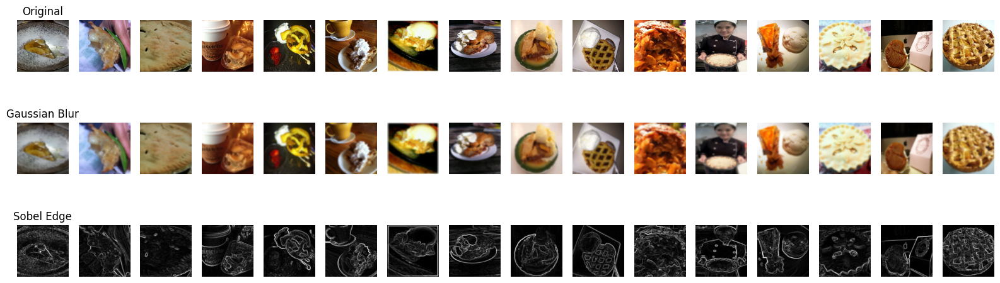

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.preprocessing.image import ImageDataGenerator

#  Cargar las 32 primeras imágenes sin filtro
vis_gen = ImageDataGenerator(rescale=1./255).flow_from_directory(
    train_dir, target_size=(128,128), batch_size=32, class_mode=None, shuffle=False
)
imgs = next(vis_gen)  # Shape (32,128,128,3)

#  Definir nuevos filtros
def gaussian_blur(img):
    return cv2.GaussianBlur(img, (7,7), sigmaX=1.5)

def sobel_edge(img):
    gray = cv2.cvtColor((img*255).astype('uint8'), cv2.COLOR_RGB2GRAY)
    sx   = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    sy   = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    mag  = np.sqrt(sx*sx + sy*sy)
    return (mag/np.max(mag)).astype('float32')

#  Aplicamos y visualizamos
fig, axes = plt.subplots(3, 16, figsize=(20,6))


for i in range(16):  #  range(16)

    row_idx = 0
    col_idx = i
    axes[row_idx, col_idx].imshow(imgs[i])
    axes[row_idx, col_idx].axis('off')
    # Gaussian Blur Images
    row_idx = 1
    col_idx = i
    axes[row_idx, col_idx].imshow(gaussian_blur(imgs[i]))
    axes[row_idx, col_idx].axis('off')
    # Sobel Edge Images
    row_idx = 2
    col_idx = i
    axes[row_idx, col_idx].imshow(sobel_edge(imgs[i]), cmap='gray')
    axes[row_idx, col_idx].axis('off')

axes[0,0].set_title("Original")
axes[1,0].set_title("Gaussian Blur")
axes[2,0].set_title("Sobel Edge")
plt.show()

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(
    rescale=1./255,
    preprocessing_function=lambda x: sobel_edge(x)[..., np.newaxis],
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.1
)

train_gen = train_datagen.flow_from_directory(
    train_dir, target_size=(128,128), color_mode='grayscale',
    batch_size=32, class_mode='categorical', subset='training'
)
val_gen = train_datagen.flow_from_directory(
    train_dir, target_size=(128,128), color_mode='grayscale',
    batch_size=32, class_mode='categorical', subset='validation'
)


Found 90900 images belonging to 101 classes.
Found 10100 images belonging to 101 classes.


Found 101000 images belonging to 101 classes.


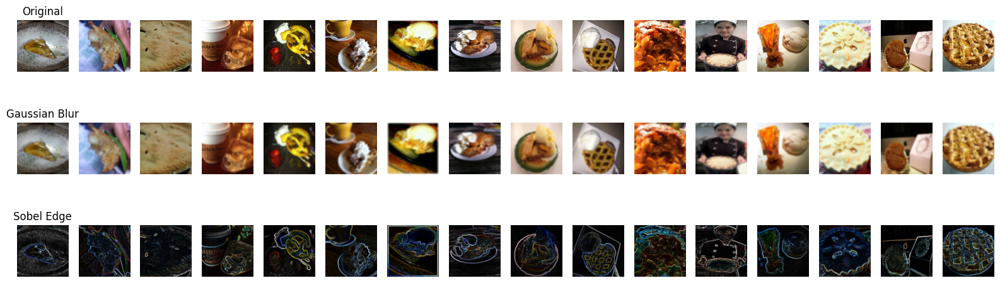

In [ ]:
#Modifcaiones a la implementacióon
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Cargar las 32 primeras imágenes sin filtro
vis_gen = ImageDataGenerator(rescale=1./255).flow_from_directory(
    train_dir, target_size=(128,128), batch_size=32, class_mode=None, shuffle=False
)
imgs = next(vis_gen)  # Shape (32,128,128,3)

#  Definir nuevos filtros
def gaussian_blur(img):
    return cv2.GaussianBlur(img, (7,7), sigmaX=1.5)

def sobel_edge(img):

    gray = (img*255).astype('uint8')
    sx   = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    sy   = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    mag  = np.sqrt(sx*sx + sy*sy)
    return (mag/np.max(mag)).astype('float32')

#  Aplicamos y visualizamos
fig, axes = plt.subplots(3, 16, figsize=(20,6))


for i in range(16):  # range(16)

    row_idx = 0
    col_idx = i
    axes[row_idx, col_idx].imshow(imgs[i])
    axes[row_idx, col_idx].axis('off')
    # Gaussian Blur Images
    row_idx = 1
    col_idx = i
    axes[row_idx, col_idx].imshow(gaussian_blur(imgs[i]))
    axes[row_idx, col_idx].axis('off')
    # Sobel Edge Images
    row_idx = 2
    col_idx = i
    axes[row_idx, col_idx].imshow(sobel_edge(imgs[i]), cmap='gray')
    axes[row_idx, col_idx].axis('off')

axes[0,0].set_title("Original")
axes[1,0].set_title("Gaussian Blur")
axes[2,0].set_title("Sobel Edge")
plt.show()

Dataset descargado en: /kaggle/input/food41
Usando clases: ['apple_pie', 'baby_back_ribs', 'baklava', 'beef_carpaccio', 'beef_tartare', 'beet_salad', 'beignets', 'bibimbap', 'bread_pudding', 'breakfast_burrito', 'bruschetta', 'caesar_salad', 'cannoli', 'caprese_salad', 'carrot_cake', 'ceviche', 'cheese_plate', 'cheesecake', 'chicken_curry', 'chicken_quesadilla', 'chicken_wings', 'chocolate_cake', 'chocolate_mousse', 'churros', 'clam_chowder', 'club_sandwich', 'crab_cakes', 'creme_brulee', 'croque_madame', 'cup_cakes', 'deviled_eggs', 'donuts', 'dumplings', 'edamame', 'eggs_benedict', 'escargots', 'falafel', 'filet_mignon', 'fish_and_chips', 'foie_gras']
Found 32000 images belonging to 40 classes.
Found 8000 images belonging to 40 classes.


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_128            │ (None, 1280)           │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 512)            │       655,872 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 40)             │        20,520 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,939,496 (11.21 MB)

 Trainable params: 678,952 (2.59 MB)

 Non-trainable params: 2,260,544 (8.62 MB)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/8
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 0s 690ms/step - accuracy: 0.1506 - loss: 3.6471

1000/1000 ━━━━━━━━━━━━━━━━━━━━ 869s 863ms/step - accuracy: 0.1507 - loss: 3.6466 - val_accuracy: 0.4396 - val_loss: 2.0738 - learning_rate: 1.0000e-04
Epoch 2/8
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 0s 695ms/step - accuracy: 0.3640 - loss: 2.4206

1000/1000 ━━━━━━━━━━━━━━━━━━━━ 898s 898ms/step - accuracy: 0.3640 - loss: 2.4205 - val_accuracy: 0.4863 - val_loss: 1.8906 - learning_rate: 1.0000e-04
Epoch 3/8
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 0s 681ms/step - accuracy: 0.4118 - loss: 2.2002

1000/1000 ━━━━━━━━━━━━━━━━━━━━ 858s 858ms/step - accuracy: 0.4118 - loss: 2.2001 - val_accuracy: 0.5015 - val_loss: 1.8051 - learning_rate: 1.0000e-04
Epoch 4/8
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 0s 659ms/step - accuracy: 0.4469 - loss: 2.0513

1000/1000 ━━━━━━━━━━━━━━━━━━━━ 820s 820ms/step - accuracy: 0.4469 - loss: 2.0513 - val_accuracy: 0.5174 - val_loss: 1.7486 - learning_rate: 1.0000e-04
Epoch 5/8
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 0s 655ms/step - accuracy: 0.4663 - loss: 1.9457

1000/1000 ━━━━━━━━━━━━━━━━━━━━ 819s 819ms/step - accuracy: 0.4664 - loss: 1.9457 - val_accuracy: 0.5264 - val_loss: 1.7210 - learning_rate: 1.0000e-04
Epoch 6/8
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 0s 665ms/step - accuracy: 0.4782 - loss: 1.9090

1000/1000 ━━━━━━━━━━━━━━━━━━━━ 824s 824ms/step - accuracy: 0.4782 - loss: 1.9090 - val_accuracy: 0.5285 - val_loss: 1.6953 - learning_rate: 1.0000e-04
Epoch 7/8
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 0s 652ms/step - accuracy: 0.4926 - loss: 1.8367

1000/1000 ━━━━━━━━━━━━━━━━━━━━ 813s 813ms/step - accuracy: 0.4926 - loss: 1.8367 - val_accuracy: 0.5366 - val_loss: 1.6887 - learning_rate: 1.0000e-04
Epoch 8/8
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 0s 664ms/step - accuracy: 0.4976 - loss: 1.8095

1000/1000 ━━━━━━━━━━━━━━━━━━━━ 866s 866ms/step - accuracy: 0.4976 - loss: 1.8095 - val_accuracy: 0.5340 - val_loss: 1.6716 - learning_rate: 1.0000e-04
Epoch 1/8
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 1113s 1s/step - accuracy: 0.4131 - loss: 2.1522 - val_accuracy: 0.5214 - val_loss: 1.7628 - learning_rate: 1.0000e-05
Epoch 2/8
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 0s 893ms/step - accuracy: 0.4774 - loss: 1.9117

1000/1000 ━━━━━━━━━━━━━━━━━━━━ 1053s 1s/step - accuracy: 0.4775 - loss: 1.9116 - val_accuracy: 0.5415 - val_loss: 1.6644 - learning_rate: 1.0000e-05
Epoch 3/8
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 0s 901ms/step - accuracy: 0.5049 - loss: 1.7980

1000/1000 ━━━━━━━━━━━━━━━━━━━━ 1062s 1s/step - accuracy: 0.5049 - loss: 1.7980 - val_accuracy: 0.5552 - val_loss: 1.6043 - learning_rate: 1.0000e-05
Epoch 4/8
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 0s 905ms/step - accuracy: 0.5253 - loss: 1.7223

1000/1000 ━━━━━━━━━━━━━━━━━━━━ 1060s 1s/step - accuracy: 0.5253 - loss: 1.7223 - val_accuracy: 0.5670 - val_loss: 1.5622 - learning_rate: 1.0000e-05
Epoch 5/8
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 0s 905ms/step - accuracy: 0.5394 - loss: 1.6643

1000/1000 ━━━━━━━━━━━━━━━━━━━━ 1108s 1s/step - accuracy: 0.5394 - loss: 1.6643 - val_accuracy: 0.5731 - val_loss: 1.5249 - learning_rate: 1.0000e-05
Epoch 6/8
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 0s 901ms/step - accuracy: 0.5534 - loss: 1.6007

1000/1000 ━━━━━━━━━━━━━━━━━━━━ 1062s 1s/step - accuracy: 0.5534 - loss: 1.6007 - val_accuracy: 0.5826 - val_loss: 1.5088 - learning_rate: 1.0000e-05
Epoch 7/8
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 0s 902ms/step - accuracy: 0.5613 - loss: 1.5739

1000/1000 ━━━━━━━━━━━━━━━━━━━━ 1061s 1s/step - accuracy: 0.5613 - loss: 1.5739 - val_accuracy: 0.5938 - val_loss: 1.4713 - learning_rate: 1.0000e-05
Epoch 8/8
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 0s 878ms/step - accuracy: 0.5712 - loss: 1.5374

1000/1000 ━━━━━━━━━━━━━━━━━━━━ 1081s 1s/step - accuracy: 0.5712 - loss: 1.5374 - val_accuracy: 0.5980 - val_loss: 1.4438 - learning_rate: 1.0000e-05


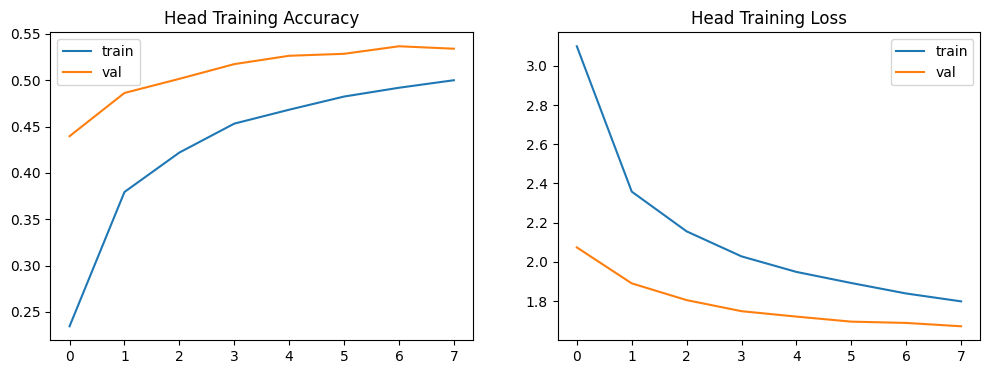

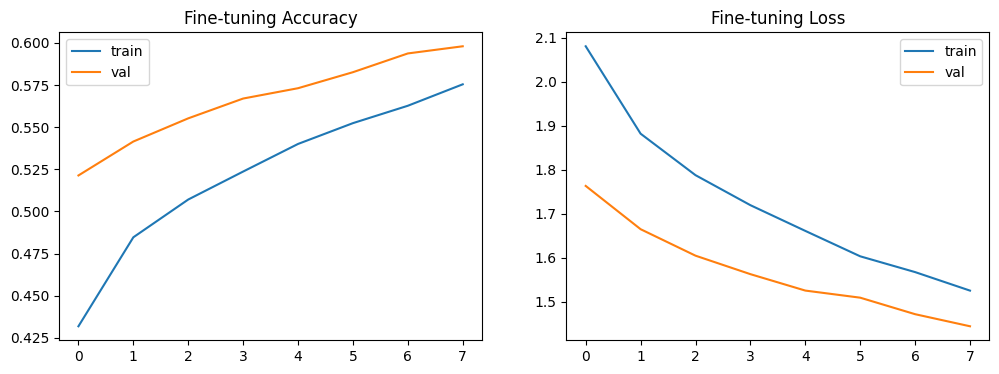

250/250 ━━━━━━━━━━━━━━━━━━━━ 158s 623ms/step


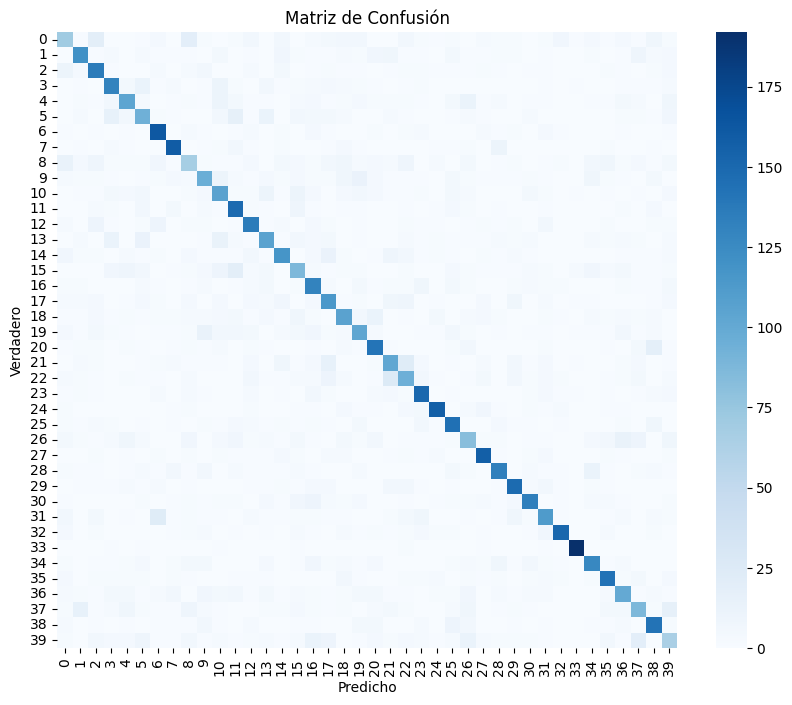

                    precision    recall  f1-score   support

         apple_pie     0.4356    0.3550    0.3912       200
    baby_back_ribs     0.6593    0.6000    0.6283       200
           baklava     0.5880    0.6850    0.6328       200
    beef_carpaccio     0.6121    0.6550    0.6329       200
      beef_tartare     0.5810    0.5200    0.5488       200
        beet_salad     0.4947    0.4700    0.4821       200
          beignets     0.6722    0.8100    0.7347       200
          bibimbap     0.7681    0.7950    0.7813       200
     bread_pudding     0.3988    0.3350    0.3641       200
 breakfast_burrito     0.5246    0.4800    0.5013       200
        bruschetta     0.4862    0.5300    0.5072       200
      caesar_salad     0.5936    0.7450    0.6608       200
           cannoli     0.6210    0.6800    0.6492       200
     caprese_salad     0.5579    0.5300    0.5436       200
       carrot_cake     0.6190    0.5850    0.6015       200
           ceviche     0.4555    0.4350

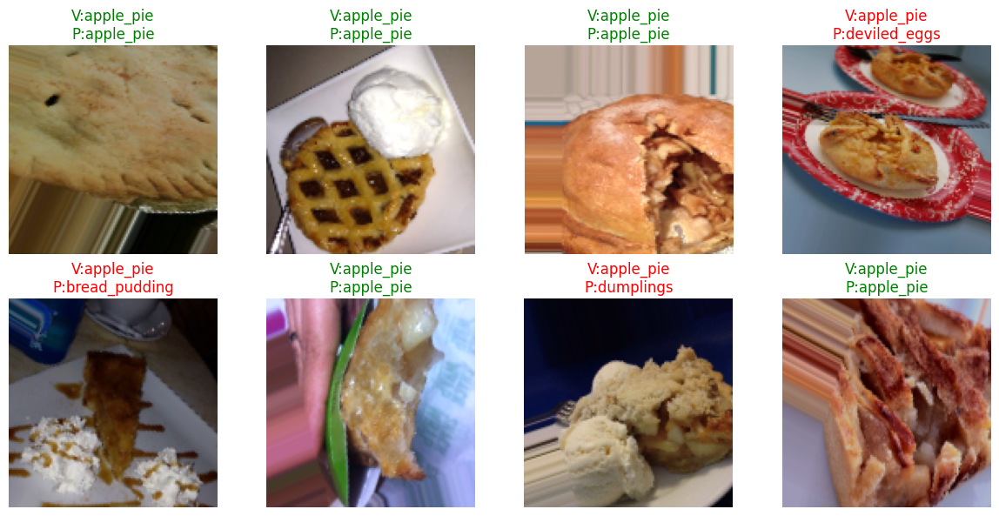

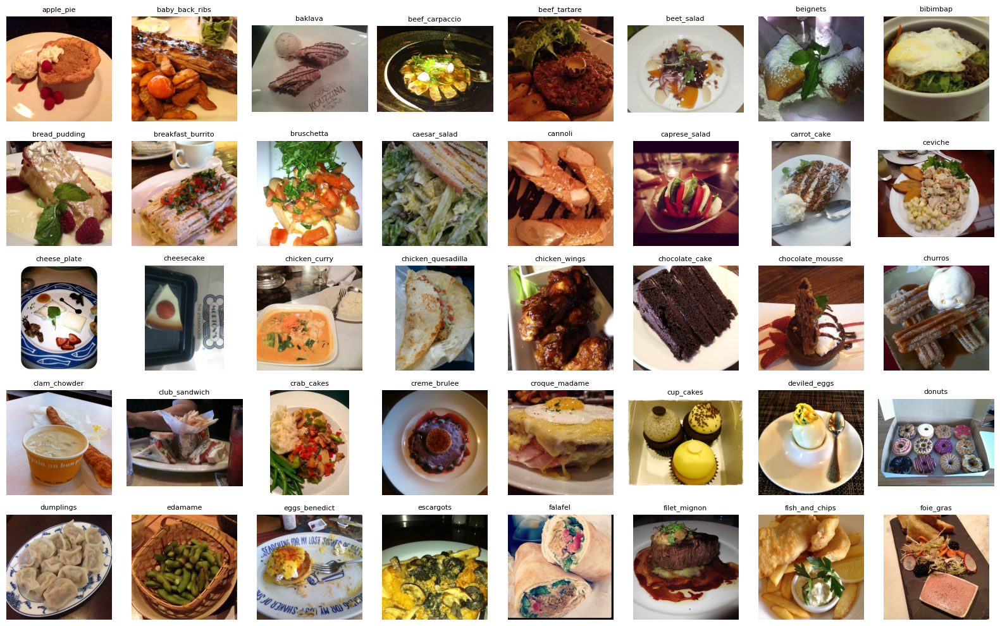

In [ ]:
# ── Después de un buen rato andar revisando como mejorar la implementación ────
!pip install --quiet kagglehub seaborn

import os
import zipfile
import random
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from kagglehub import dataset_download
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import confusion_matrix, classification_report

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models, callbacks

# Descarga y extracción de Food‑41
dataset_path = dataset_download("kmader/food41")
print("Dataset descargado en:", dataset_path)

if dataset_path.lower().endswith(".zip"):
    with zipfile.ZipFile(dataset_path, "r") as z:
        z.extractall("food41")
    data_dir = "food41"
else:
    data_dir = dataset_path

images_dir = os.path.join(data_dir, "images")

#Selección de 40 clases (Vamos a iniciar con 40 clases, depués haremos prubas con otras mas)
all_classes = sorted(os.listdir(images_dir))
selected_classes = all_classes[:40]
print("Usando clases:", selected_classes)

#  Data augmentation RGB + split 80/20
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    brightness_range=(0.8,1.2),
    validation_split=0.2
)

train_gen = datagen.flow_from_directory(
    images_dir,
    target_size=(128,128),
    color_mode="rgb",
    classes=selected_classes,
    class_mode="categorical",
    subset="training",
    batch_size=32,
    shuffle=True
)
val_gen = datagen.flow_from_directory(
    images_dir,
    target_size=(128,128),
    color_mode="rgb",
    classes=selected_classes,
    class_mode="categorical",
    subset="validation",
    batch_size=32,
    shuffle=False
)

#  Cálculo de class weights para balancear
y_train = train_gen.classes
cls_ids = np.unique(y_train)
cw = compute_class_weight("balanced", classes=cls_ids, y=y_train)
class_weights = dict(zip(cls_ids, cw))

#  Transfer Learning: MobileNetV2 backbone
n_classes = len(selected_classes)
base = tf.keras.applications.MobileNetV2(
    input_shape=(128,128,3),
    include_top=False,
    weights="imagenet",
    pooling="avg"
)
base.trainable = False

model = models.Sequential([
    base,
    layers.BatchNormalization(),
    layers.Dense(512, activation="relu"),
    layers.Dropout(0.5),
    layers.Dense(n_classes, activation="softmax")
])

model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)
model.summary()

#  Callbacks
es = callbacks.EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True)
mc = callbacks.ModelCheckpoint("best_model.h5", save_best_only=True)
tb = callbacks.TensorBoard(log_dir="logs/")
rlr = callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.5,
                                   patience=3, min_lr=1e-6)

# Training sin fine‑tune
history = model.fit(
    train_gen,
    epochs=8,
    validation_data=val_gen,
    class_weight=class_weights,
    callbacks=[es, mc, tb, rlr]
)

# Fine‑tuning ───────────────────────────────────────────────────────────────
base.trainable = True
freeze_until = int(len(base.layers) * 0.7)
for layer in base.layers[:freeze_until]:
    layer.trainable = False

model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-5),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

history_ft = model.fit(
    train_gen,
    epochs=8,
    validation_data=val_gen,
    class_weight=class_weights,
    callbacks=[es, mc, tb, rlr]
)

#  Graficar curvas de entrenamiento
def plot_history(h, title):
    plt.figure(figsize=(12,4))
    plt.subplot(1,2,1)
    plt.plot(h.history["accuracy"], label="train")
    plt.plot(h.history["val_accuracy"], label="val")
    plt.title(f"{title} Accuracy")
    plt.legend()
    plt.subplot(1,2,2)
    plt.plot(h.history["loss"], label="train")
    plt.plot(h.history["val_loss"], label="val")
    plt.title(f"{title} Loss")
    plt.legend()
    plt.show()

plot_history(history,    "Head Training")
plot_history(history_ft, "Fine‑tuning")

# Evaluación y matriz de confusión
y_pred_probs = model.predict(val_gen)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = val_gen.classes

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10,8))
sns.heatmap(cm, cmap="Blues", fmt="d")
plt.title("Matriz de Confusión")
plt.xlabel("Predicho"); plt.ylabel("Verdadero")
plt.show()

print(classification_report(y_true, y_pred, target_names=selected_classes, digits=4))

# Mostrar alguanas predicciones al azar
x_val, y_val = next(val_gen)
idxs = random.sample(range(len(x_val)), 8)
fig, axes = plt.subplots(2,4, figsize=(12,6))
for ax, i in zip(axes.flatten(), idxs):
    img = x_val[i]
    true = selected_classes[np.argmax(y_val[i])]
    pred = selected_classes[np.argmax(model.predict(img[np.newaxis,...]))]
    ax.imshow(img)
    ax.set_title(f"V:{true}\nP:{pred}", color=("green" if true==pred else "red"))
    ax.axis("off")
plt.tight_layout()
plt.show()

#  Mostrar 40 clases
fig, axes = plt.subplots(5,8, figsize=(16,10))
for ax, cls in zip(axes.flatten(), selected_classes):
    cls_dir = os.path.join(images_dir, cls)
    img_file = random.choice(os.listdir(cls_dir))
    img = plt.imread(os.path.join(cls_dir, img_file))
    ax.imshow(img)
    ax.set_title(cls, fontsize=8)
    ax.axis("off")
plt.tight_layout()
plt.show()


In [ ]:
!pip install --quiet kagglehub

import os
import zipfile
import numpy as np
import matplotlib.pyplot as plt
import cv2

from kagglehub import dataset_download
from sklearn.utils.class_weight import compute_class_weight

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models, callbacks

#Descarga y extracción de Food‑41 ─── INICALMENTE LO ENCONTRE EN KAGGLE, PERO BUSCANDO ENCONTRÉ QUE SE PODÍA DESCARGAR MAS FACIL ASÍ Y NO TENER QUE DESCARGARR LA BASE DE DATOS APROX 5GB.
dataset_path = dataset_download("kmader/food41")
print("Dataset descargado en:", dataset_path)

if dataset_path.lower().endswith(".zip"):
    with zipfile.ZipFile(dataset_path, "r") as z:
        z.extractall("food41")
    data_dir = "food41"
else:
    data_dir = dataset_path

train_dir = os.path.join(data_dir, "images")  # carpeta con 41 subcarpetas

# Data augmentation RGB + split 70/30
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.3
)

train_gen = datagen.flow_from_directory(
    train_dir,
    target_size=(128,128),
    color_mode="rgb",
    batch_size=32,
    class_mode="categorical",
    subset="training"
)
val_gen = datagen.flow_from_directory(
    train_dir,
    target_size=(128,128),
    color_mode="rgb",
    batch_size=32,
    class_mode="categorical",
    subset="validation"
)



Dataset descargado en: /kaggle/input/food41
Found 70700 images belonging to 101 classes.
Found 30300 images belonging to 101 classes.


In [ ]:
# Calculo de "lass weights " para balanceo
labels = train_gen.classes
classes = np.unique(labels)
cw = compute_class_weight("balanced", classes=classes, y=labels)
class_weights = dict(zip(classes, cw))

# Definición de modelo con Transfer Learning
n_classes = train_gen.num_classes

base_model = tf.keras.applications.MobileNetV2(
    input_shape=(128,128,3),
    include_top=False,
    weights="imagenet",
    pooling="avg"
)
base_model.trainable = False  # congelamos el backbone

model = models.Sequential([
    base_model,
    layers.Dense(256, activation="relu"),
    layers.Dropout(0.3),
    layers.Dense(n_classes, activation="softmax")
])

model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)
model.summary()



9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_128            │ (None, 1280)           │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 101)            │        25,957 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,611,877 (9.96 MB)

 Trainable params: 353,893 (1.35 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
#Configuramos
es = callbacks.EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True)
mc = callbacks.ModelCheckpoint("best_model.h5", save_best_only=True)
tb = callbacks.TensorBoard(log_dir="logs/")

# Calcular steps_per epoch
total_train_batches = train_gen.samples // train_gen.batch_size
total_val_batches   = val_gen.samples   // val_gen.batch_size

half_train_steps = total_train_batches #// 3
half_val_steps   = total_val_batches   #// 3

print(f"Steps de entrenamiento : {half_train_steps} / {total_train_batches}")
print(f"Steps de validación  : {half_val_steps} / {total_val_batches}")



Steps de entrenamiento : 2209 / 2209
Steps de validación  : 946 / 946


In [ ]:
# Entrenamiento de la cabeza (solo dense)
history = model.fit(
    train_gen,
    steps_per_epoch=half_train_steps,
    epochs=5,
    validation_data=val_gen,
    validation_steps=half_val_steps,
    class_weight=class_weights,
    callbacks=[es, mc, tb]
)

# fine‑tuning: descongelar ultimas capas del backbone
base_model.trainable = True
for layer in base_model.layers[:]:
    layer.trainable = False

model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-5),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

history_ft = model.fit(
    train_gen,
    steps_per_epoch=half_train_steps,
    epochs=5,
    validation_data=val_gen,
    validation_steps=half_val_steps,
    class_weight=class_weights,
    callbacks=[es, mc, tb]
)



/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
2209/2209 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step - accuracy: 0.0852 - loss: 4.2521

2209/2209 ━━━━━━━━━━━━━━━━━━━━ 1002s 446ms/step - accuracy: 0.0852 - loss: 4.2518 - val_accuracy: 0.3152 - val_loss: 2.9127
Epoch 2/5
   1/2209 ━━━━━━━━━━━━━━━━━━━━ 43s 20ms/step - accuracy: 0.2188 - loss: 3.2415

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


2209/2209 ━━━━━━━━━━━━━━━━━━━━ 178s 81ms/step - accuracy: 0.2188 - loss: 3.2415 - val_accuracy: 0.3203 - val_loss: 2.9129
Epoch 3/5
2209/2209 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step - accuracy: 0.2763 - loss: 3.0384

2209/2209 ━━━━━━━━━━━━━━━━━━━━ 657s 274ms/step - accuracy: 0.2763 - loss: 3.0384 - val_accuracy: 0.3725 - val_loss: 2.5942
Epoch 4/5
2209/2209 ━━━━━━━━━━━━━━━━━━━━ 177s 80ms/step - accuracy: 0.3438 - loss: 2.9343 - val_accuracy: 0.3722 - val_loss: 2.5961
Epoch 5/5
2209/2209 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step - accuracy: 0.3338 - loss: 2.7457

2209/2209 ━━━━━━━━━━━━━━━━━━━━ 622s 273ms/step - accuracy: 0.3338 - loss: 2.7457 - val_accuracy: 0.3934 - val_loss: 2.4911
Epoch 1/5
2209/2209 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step - accuracy: 0.3623 - loss: 2.6046

2209/2209 ━━━━━━━━━━━━━━━━━━━━ 611s 273ms/step - accuracy: 0.3623 - loss: 2.6046 - val_accuracy: 0.3989 - val_loss: 2.4581
Epoch 2/5
   1/2209 ━━━━━━━━━━━━━━━━━━━━ 42s 19ms/step - accuracy: 0.4062 - loss: 2.5430

2209/2209 ━━━━━━━━━━━━━━━━━━━━ 177s 80ms/step - accuracy: 0.4062 - loss: 2.5430 - val_accuracy: 0.4014 - val_loss: 2.4524
Epoch 3/5
2209/2209 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step - accuracy: 0.3714 - loss: 2.5800

2209/2209 ━━━━━━━━━━━━━━━━━━━━ 630s 277ms/step - accuracy: 0.3714 - loss: 2.5800 - val_accuracy: 0.4054 - val_loss: 2.4363
Epoch 4/5
   1/2209 ━━━━━━━━━━━━━━━━━━━━ 40s 18ms/step - accuracy: 0.4688 - loss: 2.3711

2209/2209 ━━━━━━━━━━━━━━━━━━━━ 178s 81ms/step - accuracy: 0.4688 - loss: 2.3711 - val_accuracy: 0.4057 - val_loss: 2.4287
Epoch 5/5
2209/2209 ━━━━━━━━━━━━━━━━━━━━ 610s 270ms/step - accuracy: 0.3708 - loss: 2.5662 - val_accuracy: 0.4033 - val_loss: 2.4396


In [ ]:
# Qué accurancy tan pobreeeeeee :C

946/946 ━━━━━━━━━━━━━━━━━━━━ 180s 191ms/step - accuracy: 0.4001 - loss: 2.4645

Precisión final en validación: 0.4035


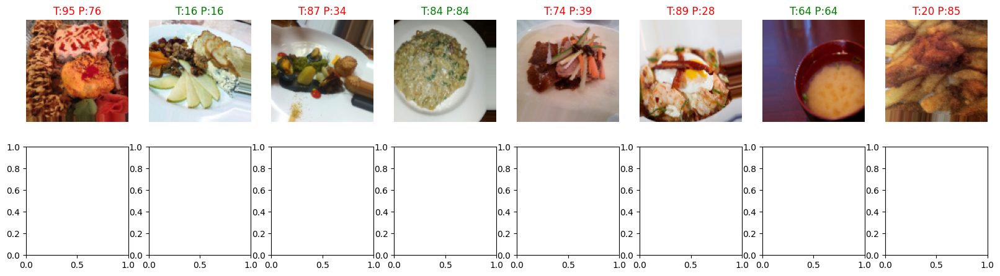

In [ ]:
# Evaluación final sobre validacion
loss, acc = model.evaluate(val_gen, steps=half_val_steps)
print(f"\nPrecisión final en validación: {acc:.4f}")

# Predicciones
import random, itertools

x_val, y_val = next(val_gen)
idxs = random.sample(range(len(x_val)), 8)
fig, axes = plt.subplots(2, 8, figsize=(20,5))

for ax, i in zip(axes.flatten(), idxs):
    img   = x_val[i]
    true  = np.argmax(y_val[i])
    predp = model.predict(img[np.newaxis,...], verbose=0)
    pred  = np.argmax(predp, axis=1)[0]
    ax.imshow(img)
    ax.set_title(f"T:{true} P:{pred}", color=("green" if true==pred else "red"))
    ax.axis("off")

plt.show()

In [ ]:

!pip install --quiet kagglehub seaborn

import os
import zipfile
import random
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from kagglehub import dataset_download
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import confusion_matrix, classification_report

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models, callbacks


dataset_path = dataset_download("kmader/food41")
print("Dataset descargado en:", dataset_path)

if dataset_path.lower().endswith(".zip"):
    with zipfile.ZipFile(dataset_path, "r") as z:
        z.extractall("food41")
    data_dir = "food41"
else:
    data_dir = dataset_path

images_dir = os.path.join(data_dir, "images")

# Ahora con 80 clases
all_classes = sorted(os.listdir(images_dir))
selected_classes = all_classes[:80]
print("Usando clases:", selected_classes)

Dataset descargado en: /kaggle/input/food41
Usando clases: ['apple_pie', 'baby_back_ribs', 'baklava', 'beef_carpaccio', 'beef_tartare', 'beet_salad', 'beignets', 'bibimbap', 'bread_pudding', 'breakfast_burrito', 'bruschetta', 'caesar_salad', 'cannoli', 'caprese_salad', 'carrot_cake', 'ceviche', 'cheese_plate', 'cheesecake', 'chicken_curry', 'chicken_quesadilla', 'chicken_wings', 'chocolate_cake', 'chocolate_mousse', 'churros', 'clam_chowder', 'club_sandwich', 'crab_cakes', 'creme_brulee', 'croque_madame', 'cup_cakes', 'deviled_eggs', 'donuts', 'dumplings', 'edamame', 'eggs_benedict', 'escargots', 'falafel', 'filet_mignon', 'fish_and_chips', 'foie_gras', 'french_fries', 'french_onion_soup', 'french_toast', 'fried_calamari', 'fried_rice', 'frozen_yogurt', 'garlic_bread', 'gnocchi', 'greek_salad', 'grilled_cheese_sandwich', 'grilled_salmon', 'guacamole', 'gyoza', 'hamburger', 'hot_and_sour_soup', 'hot_dog', 'huevos_rancheros', 'hummus', 'ice_cream', 'lasagna', 'lobster_bisque', 'lobster_r

In [ ]:


# Data augmentation RGB + split 70/30
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    brightness_range=(0.8,1.2),
    validation_split=0.3
)

train_gen = datagen.flow_from_directory(
    images_dir,
    target_size=(128,128),
    color_mode="rgb",
    classes=selected_classes,
    class_mode="categorical",
    subset="training",
    batch_size=32,
    shuffle=True
)
val_gen = datagen.flow_from_directory(
    images_dir,
    target_size=(128,128),
    color_mode="rgb",
    classes=selected_classes,
    class_mode="categorical",
    subset="validation",
    batch_size=32,
    shuffle=False
)

# Cálculo de class weights para balanceo
y_train = train_gen.classes
cls_ids = np.unique(y_train)
cw = compute_class_weight("balanced", classes=cls_ids, y=y_train)
class_weights = dict(zip(cls_ids, cw))

#  Transfer Learning: MobileNetV2 backbone
n_classes = len(selected_classes)
base = tf.keras.applications.MobileNetV2(
    input_shape=(128,128,3),
    include_top=False,
    weights="imagenet",
    pooling="avg"
)
base.trainable = False

model = models.Sequential([
    base,
    layers.BatchNormalization(),
    layers.Dense(512, activation="relu"),
    layers.Dropout(0.5),
    layers.Dense(n_classes, activation="softmax")
])

model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)
model.summary()



Found 56000 images belonging to 80 classes.
Found 24000 images belonging to 80 classes.


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_128            │ (None, 1280)           │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │       655,872 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 80)             │        41,040 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,960,016 (11.29 MB)

 Trainable params: 699,472 (2.67 MB)

 Non-trainable params: 2,260,544 (8.62 MB)

In [ ]:
# Callbacks
es = callbacks.EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True)
mc = callbacks.ModelCheckpoint("best_model.h5", save_best_only=True)
tb = callbacks.TensorBoard(log_dir="logs/")
rlr = callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.5,
                                   patience=3, min_lr=1e-6)

# Training sin fine‑tune
history = model.fit(
    train_gen,
    epochs=8,
    validation_data=val_gen,
    class_weight=class_weights,
    callbacks=[es, mc, tb, rlr]
)

#  Fine‑tuning
base.trainable = True
freeze_until = int(len(base.layers) * 0.7)
for layer in base.layers[:freeze_until]:
    layer.trainable = False

model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-5),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

history_ft = model.fit(
    train_gen,
    epochs=8,
    validation_data=val_gen,
    class_weight=class_weights,
    callbacks=[es, mc, tb, rlr]
)



/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/8
1750/1750 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - accuracy: 0.1109 - loss: 4.2434

1750/1750 ━━━━━━━━━━━━━━━━━━━━ 562s 309ms/step - accuracy: 0.1109 - loss: 4.2431 - val_accuracy: 0.3702 - val_loss: 2.5567 - learning_rate: 1.0000e-04
Epoch 2/8
1750/1750 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step - accuracy: 0.3024 - loss: 2.9114

1750/1750 ━━━━━━━━━━━━━━━━━━━━ 526s 300ms/step - accuracy: 0.3024 - loss: 2.9114 - val_accuracy: 0.4172 - val_loss: 2.3231 - learning_rate: 1.0000e-04
Epoch 3/8
1750/1750 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step - accuracy: 0.3482 - loss: 2.6525

1750/1750 ━━━━━━━━━━━━━━━━━━━━ 575s 329ms/step - accuracy: 0.3482 - loss: 2.6525 - val_accuracy: 0.4398 - val_loss: 2.2330 - learning_rate: 1.0000e-04
Epoch 4/8
1750/1750 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step - accuracy: 0.3782 - loss: 2.5015

1750/1750 ━━━━━━━━━━━━━━━━━━━━ 575s 302ms/step - accuracy: 0.3782 - loss: 2.5015 - val_accuracy: 0.4518 - val_loss: 2.1835 - learning_rate: 1.0000e-04
Epoch 5/8
1750/1750 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step - accuracy: 0.3959 - loss: 2.4163

1750/1750 ━━━━━━━━━━━━━━━━━━━━ 524s 299ms/step - accuracy: 0.3959 - loss: 2.4163 - val_accuracy: 0.4576 - val_loss: 2.1425 - learning_rate: 1.0000e-04
Epoch 6/8
1750/1750 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step - accuracy: 0.4106 - loss: 2.3355

1750/1750 ━━━━━━━━━━━━━━━━━━━━ 523s 299ms/step - accuracy: 0.4106 - loss: 2.3355 - val_accuracy: 0.4625 - val_loss: 2.1124 - learning_rate: 1.0000e-04
Epoch 7/8
1750/1750 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step - accuracy: 0.4235 - loss: 2.2846

1750/1750 ━━━━━━━━━━━━━━━━━━━━ 530s 303ms/step - accuracy: 0.4235 - loss: 2.2846 - val_accuracy: 0.4641 - val_loss: 2.1007 - learning_rate: 1.0000e-04
Epoch 8/8
1750/1750 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step - accuracy: 0.4344 - loss: 2.2387

1750/1750 ━━━━━━━━━━━━━━━━━━━━ 525s 300ms/step - accuracy: 0.4344 - loss: 2.2387 - val_accuracy: 0.4705 - val_loss: 2.0764 - learning_rate: 1.0000e-04
Epoch 1/8
1750/1750 ━━━━━━━━━━━━━━━━━━━━ 557s 306ms/step - accuracy: 0.3486 - loss: 2.6237 - val_accuracy: 0.4674 - val_loss: 2.1097 - learning_rate: 1.0000e-05
Epoch 2/8
1750/1750 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.4186 - loss: 2.3086

1750/1750 ━━━━━━━━━━━━━━━━━━━━ 533s 304ms/step - accuracy: 0.4186 - loss: 2.3086 - val_accuracy: 0.4860 - val_loss: 2.0264 - learning_rate: 1.0000e-05
Epoch 3/8
1750/1750 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.4408 - loss: 2.2041

1750/1750 ━━━━━━━━━━━━━━━━━━━━ 534s 305ms/step - accuracy: 0.4408 - loss: 2.2041 - val_accuracy: 0.5002 - val_loss: 1.9494 - learning_rate: 1.0000e-05
Epoch 4/8
1750/1750 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - accuracy: 0.4612 - loss: 2.1202

1750/1750 ━━━━━━━━━━━━━━━━━━━━ 558s 303ms/step - accuracy: 0.4612 - loss: 2.1202 - val_accuracy: 0.5116 - val_loss: 1.9001 - learning_rate: 1.0000e-05
Epoch 5/8
1750/1750 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - accuracy: 0.4753 - loss: 2.0517

1750/1750 ━━━━━━━━━━━━━━━━━━━━ 532s 304ms/step - accuracy: 0.4753 - loss: 2.0517 - val_accuracy: 0.5225 - val_loss: 1.8533 - learning_rate: 1.0000e-05
Epoch 6/8
1750/1750 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step - accuracy: 0.4915 - loss: 1.9685

1750/1750 ━━━━━━━━━━━━━━━━━━━━ 531s 303ms/step - accuracy: 0.4915 - loss: 1.9685 - val_accuracy: 0.5266 - val_loss: 1.8296 - learning_rate: 1.0000e-05
Epoch 7/8
1750/1750 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.5024 - loss: 1.9150

1750/1750 ━━━━━━━━━━━━━━━━━━━━ 536s 306ms/step - accuracy: 0.5024 - loss: 1.9150 - val_accuracy: 0.5432 - val_loss: 1.7805 - learning_rate: 1.0000e-05
Epoch 8/8
1750/1750 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - accuracy: 0.5068 - loss: 1.9049

1750/1750 ━━━━━━━━━━━━━━━━━━━━ 534s 305ms/step - accuracy: 0.5068 - loss: 1.9049 - val_accuracy: 0.5429 - val_loss: 1.7584 - learning_rate: 1.0000e-05


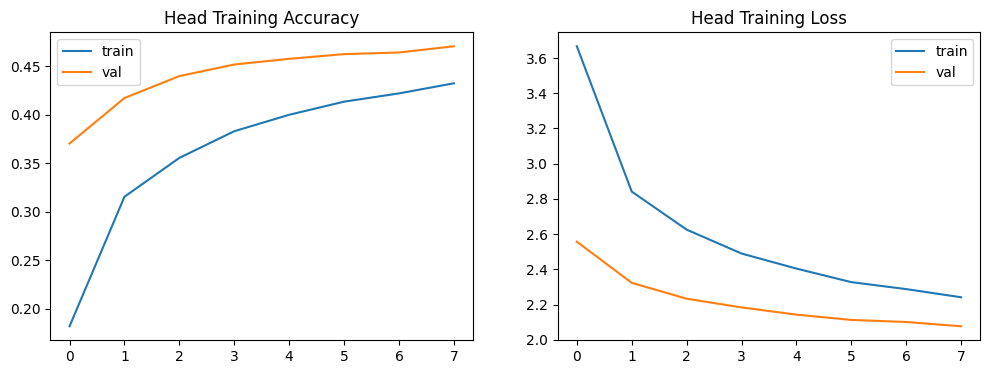

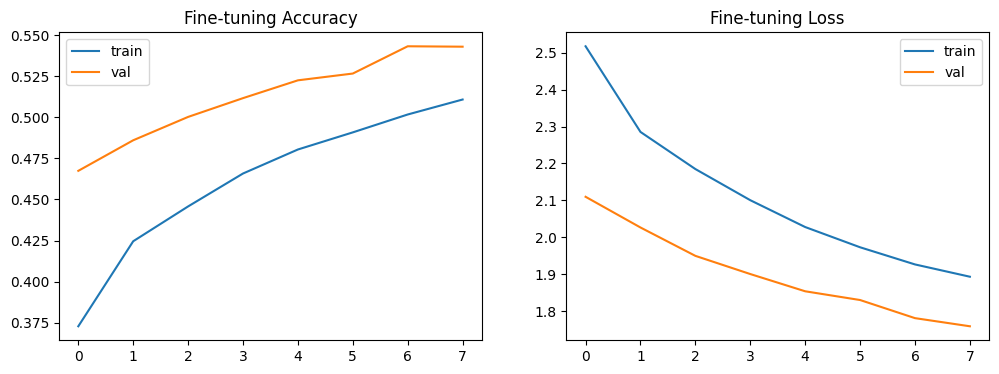

750/750 ━━━━━━━━━━━━━━━━━━━━ 160s 209ms/step


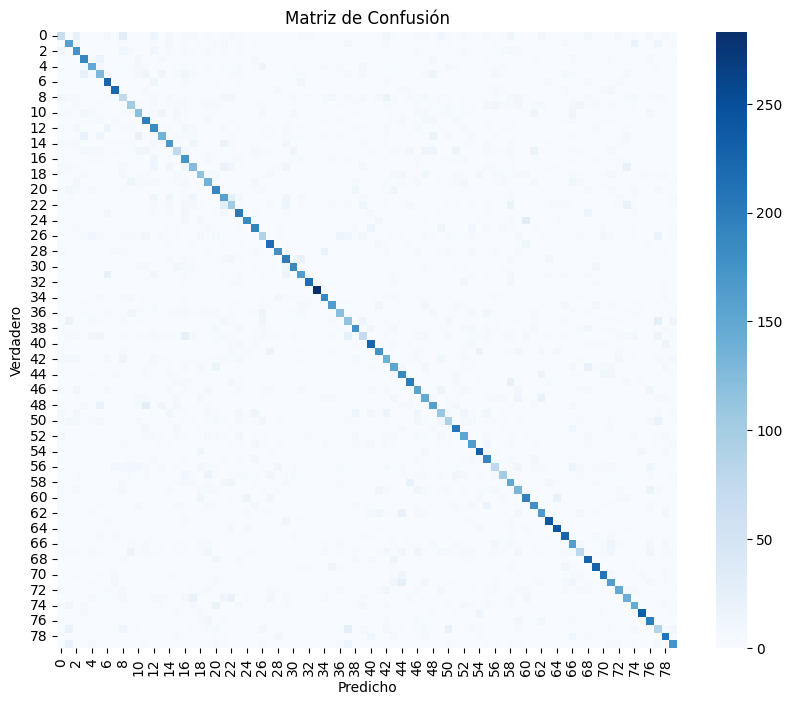

                         precision    recall  f1-score   support

              apple_pie     0.3110    0.2167    0.2554       300
         baby_back_ribs     0.4773    0.5267    0.5008       300
                baklava     0.4874    0.5800    0.5297       300
         beef_carpaccio     0.5981    0.6300    0.6136       300
           beef_tartare     0.5458    0.4967    0.5201       300
             beet_salad     0.4403    0.4300    0.4351       300
               beignets     0.6439    0.7533    0.6943       300
               bibimbap     0.6862    0.7433    0.7136       300
          bread_pudding     0.2652    0.2467    0.2556       300
      breakfast_burrito     0.3908    0.3400    0.3636       300
             bruschetta     0.4400    0.4033    0.4209       300
           caesar_salad     0.5255    0.6533    0.5825       300
                cannoli     0.4933    0.6133    0.5468       300
          caprese_salad     0.5574    0.4533    0.5000       300
            carrot_cake 

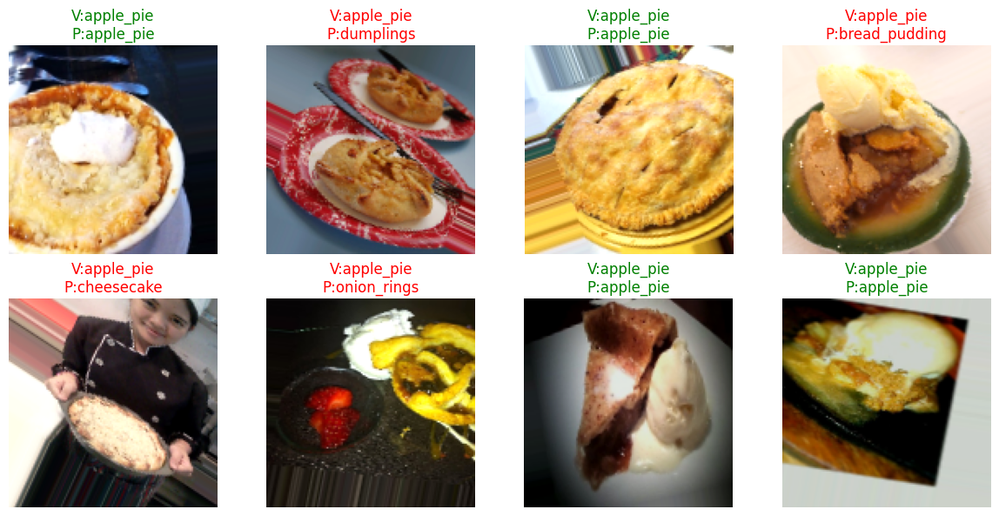

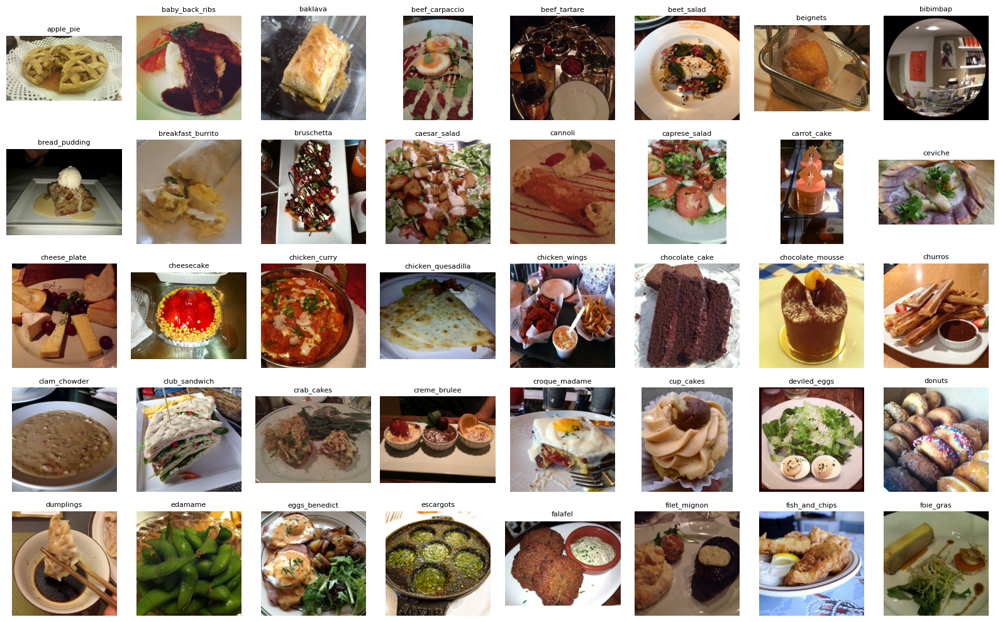

In [ ]:
#  Graficar curvas de entrenamiento
def plot_history(h, title):
    plt.figure(figsize=(12,4))
    plt.subplot(1,2,1)
    plt.plot(h.history["accuracy"], label="train")
    plt.plot(h.history["val_accuracy"], label="val")
    plt.title(f"{title} Accuracy")
    plt.legend()
    plt.subplot(1,2,2)
    plt.plot(h.history["loss"], label="train")
    plt.plot(h.history["val_loss"], label="val")
    plt.title(f"{title} Loss")
    plt.legend()
    plt.show()

plot_history(history,    "Head Training")
plot_history(history_ft, "Fine‑tuning")

# Evaluación y matriz de confusión
y_pred_probs = model.predict(val_gen)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = val_gen.classes

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10,8))
sns.heatmap(cm, cmap="Blues", fmt="d")
plt.title("Matriz de Confusión")
plt.xlabel("Predicho"); plt.ylabel("Verdadero")
plt.show()

print(classification_report(y_true, y_pred, target_names=selected_classes, digits=4))

# Mostrar 8 predicciones al azar
x_val, y_val = next(val_gen)
idxs = random.sample(range(len(x_val)), 8)
fig, axes = plt.subplots(2,4, figsize=(12,6))
for ax, i in zip(axes.flatten(), idxs):
    img = x_val[i]
    true = selected_classes[np.argmax(y_val[i])]
    pred = selected_classes[np.argmax(model.predict(img[np.newaxis,...]))]
    ax.imshow(img)
    ax.set_title(f"V:{true}\nP:{pred}", color=("green" if true==pred else "red"))
    ax.axis("off")
plt.tight_layout()
plt.show()

# Mostrar algunas clases con ejemplo
fig, axes = plt.subplots(5,8, figsize=(16,10))
for ax, cls in zip(axes.flatten(), selected_classes):
    cls_dir = os.path.join(images_dir, cls)
    img_file = random.choice(os.listdir(cls_dir))
    img = plt.imread(os.path.join(cls_dir, img_file))
    ax.imshow(img)
    ax.set_title(cls, fontsize=8)
    ax.axis("off")
plt.tight_layout()
plt.show()

In [ ]:
!pip install --quiet tensorflow_addons --upgrade
!pip install tensorflow_addons --upgrade

Clases: ['apple_pie', 'baby_back_ribs', 'baklava', 'beef_carpaccio', 'beef_tartare', 'beet_salad', 'beignets', 'bibimbap', 'bread_pudding', 'breakfast_burrito', 'bruschetta', 'caesar_salad', 'cannoli', 'caprese_salad', 'carrot_cake', 'ceviche', 'cheese_plate', 'cheesecake', 'chicken_curry', 'chicken_quesadilla', 'chicken_wings', 'chocolate_cake', 'chocolate_mousse', 'churros', 'clam_chowder', 'club_sandwich', 'crab_cakes', 'creme_brulee', 'croque_madame', 'cup_cakes', 'deviled_eggs', 'donuts', 'dumplings', 'edamame', 'eggs_benedict', 'escargots', 'falafel', 'filet_mignon', 'fish_and_chips', 'foie_gras', 'french_fries', 'french_onion_soup', 'french_toast', 'fried_calamari', 'fried_rice', 'frozen_yogurt', 'garlic_bread', 'gnocchi', 'greek_salad', 'grilled_cheese_sandwich', 'grilled_salmon', 'guacamole', 'gyoza', 'hamburger', 'hot_and_sour_soup', 'hot_dog', 'huevos_rancheros', 'hummus', 'ice_cream', 'lasagna', 'lobster_bisque', 'lobster_roll_sandwich', 'macaroni_and_cheese', 'macarons', '

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_1 (TrueDivide)      │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract_1 (Subtract)           │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_128            │ (None, 1280)           │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 80)             │       102,480 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,365,584 (9.02 MB)

 Trainable params: 105,040 (410.31 KB)

 Non-trainable params: 2,260,544 (8.62 MB)

Epoch 1/8
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step - accuracy: 0.3008 - loss: 3.4817 - precision: 0.5699 - recall: 0.1679

4000/4000 ━━━━━━━━━━━━━━━━━━━━ 1170s 291ms/step - accuracy: 0.3008 - loss: 3.4816 - precision: 0.5699 - recall: 0.1679 - val_accuracy: 0.5083 - val_loss: 2.4736 - val_precision: 0.7807 - val_recall: 0.3144 - learning_rate: 0.0010
Epoch 2/8
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step - accuracy: 0.4339 - loss: 2.7439 - precision: 0.7452 - recall: 0.2493

4000/4000 ━━━━━━━━━━━━━━━━━━━━ 1183s 296ms/step - accuracy: 0.4339 - loss: 2.7439 - precision: 0.7452 - recall: 0.2493 - val_accuracy: 0.5261 - val_loss: 2.3696 - val_precision: 0.8273 - val_recall: 0.3161 - learning_rate: 0.0010
Epoch 3/8
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step - accuracy: 0.4572 - loss: 2.6170 - precision: 0.7939 - recall: 0.2457

4000/4000 ━━━━━━━━━━━━━━━━━━━━ 1170s 292ms/step - accuracy: 0.4572 - loss: 2.6170 - precision: 0.7939 - recall: 0.2457 - val_accuracy: 0.5403 - val_loss: 2.3257 - val_precision: 0.8514 - val_recall: 0.3150 - learning_rate: 0.0010
Epoch 4/8
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step - accuracy: 0.4721 - loss: 2.5556 - precision: 0.8217 - recall: 0.2445

4000/4000 ━━━━━━━━━━━━━━━━━━━━ 1169s 292ms/step - accuracy: 0.4721 - loss: 2.5556 - precision: 0.8217 - recall: 0.2445 - val_accuracy: 0.5461 - val_loss: 2.3080 - val_precision: 0.8538 - val_recall: 0.3099 - learning_rate: 0.0010
Epoch 5/8
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step - accuracy: 0.4766 - loss: 2.5256 - precision: 0.8286 - recall: 0.2441

4000/4000 ━━━━━━━━━━━━━━━━━━━━ 1212s 303ms/step - accuracy: 0.4766 - loss: 2.5256 - precision: 0.8286 - recall: 0.2441 - val_accuracy: 0.5489 - val_loss: 2.2951 - val_precision: 0.8594 - val_recall: 0.3171 - learning_rate: 0.0010
Epoch 6/8
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step - accuracy: 0.4850 - loss: 2.5055 - precision: 0.8388 - recall: 0.2478

4000/4000 ━━━━━━━━━━━━━━━━━━━━ 1145s 286ms/step - accuracy: 0.4850 - loss: 2.5055 - precision: 0.8388 - recall: 0.2478 - val_accuracy: 0.5511 - val_loss: 2.2873 - val_precision: 0.8564 - val_recall: 0.3184 - learning_rate: 0.0010
Epoch 7/8
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step - accuracy: 0.4867 - loss: 2.4954 - precision: 0.8304 - recall: 0.2480

4000/4000 ━━━━━━━━━━━━━━━━━━━━ 1141s 285ms/step - accuracy: 0.4867 - loss: 2.4954 - precision: 0.8304 - recall: 0.2480 - val_accuracy: 0.5498 - val_loss: 2.2818 - val_precision: 0.8558 - val_recall: 0.3176 - learning_rate: 0.0010
Epoch 8/8
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step - accuracy: 0.4898 - loss: 2.4820 - precision: 0.8411 - recall: 0.2512

4000/4000 ━━━━━━━━━━━━━━━━━━━━ 1159s 285ms/step - accuracy: 0.4898 - loss: 2.4820 - precision: 0.8411 - recall: 0.2512 - val_accuracy: 0.5573 - val_loss: 2.2743 - val_precision: 0.8641 - val_recall: 0.3164 - learning_rate: 0.0010
Epoch 1/8
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step - accuracy: 0.4654 - loss: 2.5682 - precision: 0.8210 - recall: 0.2453

4000/4000 ━━━━━━━━━━━━━━━━━━━━ 1446s 358ms/step - accuracy: 0.4654 - loss: 2.5682 - precision: 0.8210 - recall: 0.2453 - val_accuracy: 0.5732 - val_loss: 2.2502 - val_precision: 0.8198 - val_recall: 0.4021 - learning_rate: 1.0000e-04
Epoch 2/8
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step - accuracy: 0.5472 - loss: 2.2838 - precision: 0.8545 - recall: 0.3357

4000/4000 ━━━━━━━━━━━━━━━━━━━━ 1403s 351ms/step - accuracy: 0.5472 - loss: 2.2838 - precision: 0.8545 - recall: 0.3357 - val_accuracy: 0.5897 - val_loss: 2.1906 - val_precision: 0.8233 - val_recall: 0.4249 - learning_rate: 1.0000e-04
Epoch 3/8
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step - accuracy: 0.5827 - loss: 2.1651 - precision: 0.8726 - recall: 0.3688

4000/4000 ━━━━━━━━━━━━━━━━━━━━ 1410s 353ms/step - accuracy: 0.5827 - loss: 2.1651 - precision: 0.8726 - recall: 0.3688 - val_accuracy: 0.5996 - val_loss: 2.1708 - val_precision: 0.8224 - val_recall: 0.4467 - learning_rate: 1.0000e-04
Epoch 4/8
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step - accuracy: 0.6108 - loss: 2.0814 - precision: 0.8814 - recall: 0.3935

4000/4000 ━━━━━━━━━━━━━━━━━━━━ 1465s 353ms/step - accuracy: 0.6108 - loss: 2.0814 - precision: 0.8814 - recall: 0.3935 - val_accuracy: 0.6211 - val_loss: 2.0578 - val_precision: 0.8584 - val_recall: 0.4485 - learning_rate: 1.0000e-04
Epoch 5/8
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step - accuracy: 0.6242 - loss: 2.0239 - precision: 0.8876 - recall: 0.4105

4000/4000 ━━━━━━━━━━━━━━━━━━━━ 1413s 353ms/step - accuracy: 0.6242 - loss: 2.0239 - precision: 0.8876 - recall: 0.4105 - val_accuracy: 0.6328 - val_loss: 2.0422 - val_precision: 0.8459 - val_recall: 0.4804 - learning_rate: 1.0000e-04
Epoch 6/8
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 1459s 352ms/step - accuracy: 0.6391 - loss: 1.9732 - precision: 0.8922 - recall: 0.4282 - val_accuracy: 0.6268 - val_loss: 2.0653 - val_precision: 0.8422 - val_recall: 0.4778 - learning_rate: 1.0000e-04
Epoch 7/8
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 1419s 355ms/step - accuracy: 0.6531 - loss: 1.9256 - precision: 0.8987 - recall: 0.4450 - val_accuracy: 0.6288 - val_loss: 2.0532 - val_precision: 0.8358 - val_recall: 0.4818 - learning_rate: 1.0000e-04
Epoch 8/8
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step - accuracy: 0.6718 - loss: 1.8717 - precision: 0.9052 - recall: 0.4669

4000/4000 ━━━━━━━━━━━━━━━━━━━━ 1398s 349ms/step - accuracy: 0.6718 - loss: 1.8717 - precision: 0.9052 - recall: 0.4669 - val_accuracy: 0.6483 - val_loss: 1.9987 - val_precision: 0.8473 - val_recall: 0.5062 - learning_rate: 5.0000e-05


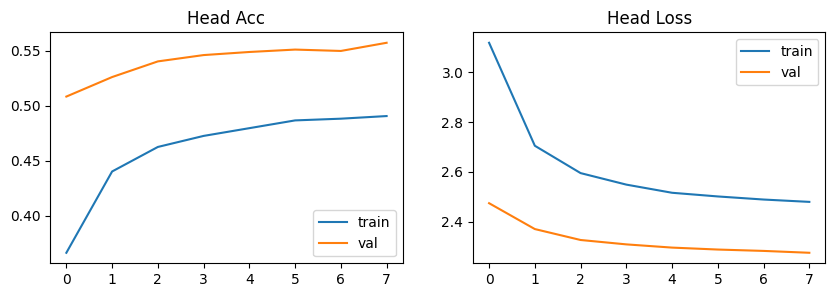

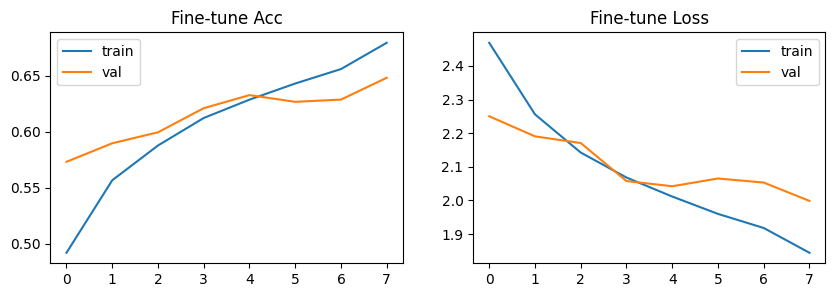

1000/1000 ━━━━━━━━━━━━━━━━━━━━ 204s 201ms/step


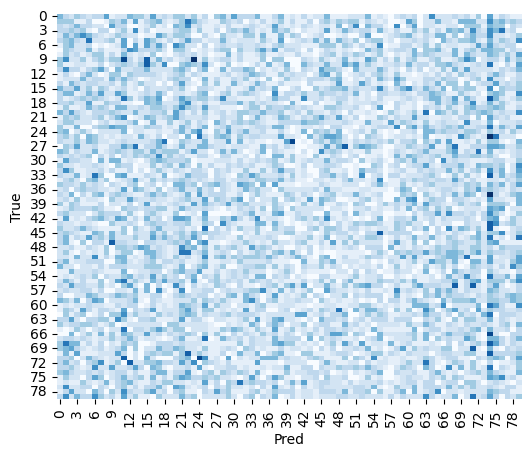

                         precision    recall  f1-score   support

              apple_pie     0.0245    0.0238    0.0242       210
         baby_back_ribs     0.0147    0.0185    0.0164       216
                baklava     0.0138    0.0155    0.0146       193
         beef_carpaccio     0.0148    0.0140    0.0144       214
           beef_tartare     0.0387    0.0348    0.0366       201
             beet_salad     0.0379    0.0359    0.0369       223
               beignets     0.0000    0.0000    0.0000       198
               bibimbap     0.0135    0.0142    0.0138       212
          bread_pudding     0.0077    0.0055    0.0064       182
      breakfast_burrito     0.0207    0.0178    0.0191       225
             bruschetta     0.0136    0.0138    0.0137       218
           caesar_salad     0.0064    0.0095    0.0077       210
                cannoli     0.0221    0.0221    0.0221       181
          caprese_salad     0.0091    0.0105    0.0098       190
            carrot_cake 

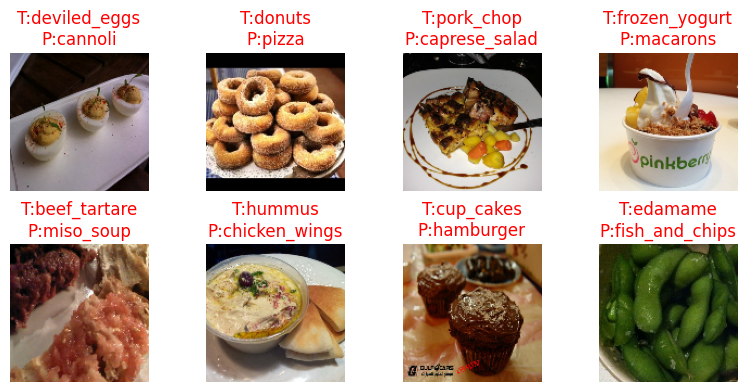

In [ ]:

!pip install --quiet kagglehub seaborn

import os, zipfile, random
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf
from tensorflow.keras import layers, models, callbacks, metrics
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import confusion_matrix, classification_report
from kagglehub import dataset_download


dataset_path = dataset_download("kmader/food41")
if dataset_path.endswith(".zip"):
    with zipfile.ZipFile(dataset_path, "r") as z:
        z.extractall("food41")
    root = "food41"
else:
    root = dataset_path
images_dir = os.path.join(root, "images")

# Selección de  clases
classes = sorted(os.listdir(images_dir))[:80]
print("Clases:", classes)

#
BATCH_SIZE = 16
IMG_SIZE   = (128, 128)

#  Crea tf.data pipelines
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    images_dir, labels="inferred", label_mode="categorical",
    class_names=classes, validation_split=0.2, subset="training",
    seed=42, image_size=IMG_SIZE, batch_size=BATCH_SIZE
)
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    images_dir, labels="inferred", label_mode="categorical",
    class_names=classes, validation_split=0.2, subset="validation",
    seed=42, image_size=IMG_SIZE, batch_size=BATCH_SIZE
)


data_augment = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
])

AUTOTUNE = tf.data.AUTOTUNE
train_ds = (
    train_ds
    .map(lambda x,y: (data_augment(x, training=True), y), num_parallel_calls=AUTOTUNE)
    .prefetch(1)
)
val_ds = val_ds.prefetch(1)

#  Calcula class weights
y_train = np.concatenate([y.numpy() for _,y in train_ds], axis=0)
labels = np.argmax(y_train, axis=1)
cw = compute_class_weight("balanced", classes=np.unique(labels), y=labels)
class_weights = dict(enumerate(cw))

# Modelo ligero: MobileNetV2
base = tf.keras.applications.MobileNetV2(
    input_shape=(*IMG_SIZE,3), include_top=False, weights="imagenet", pooling="avg"
)
base.trainable = False

inputs = layers.Input((*IMG_SIZE,3))
x = tf.keras.applications.mobilenet_v2.preprocess_input(inputs)
x = base(x, training=False)
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.4)(x)
outputs = layers.Dense(len(classes), activation="softmax")(x)

model = models.Model(inputs, outputs)

model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-3),
    loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.1),
    metrics=[
        "accuracy",
        metrics.Precision(name="precision"),
        metrics.Recall(name="recall")
    ]
)
model.summary()

# Callbacks simples
es  = callbacks.EarlyStopping(monitor="val_loss", patience=3, restore_best_weights=True)
mc  = callbacks.ModelCheckpoint("best.h5", save_best_only=True)
rlp = callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=2, min_lr=1e-6)

# Entrena la cabeza solo
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=8,
    class_weight=class_weights,
    callbacks=[es, mc, rlp]
)

# Fine‑tuning parcial
base.trainable = True
for layer in base.layers[:-20]:  # Se descongela solo las ultimas 20 capas
    layer.trainable = False

model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.1),
    metrics=["accuracy", metrics.Precision(), metrics.Recall()]
)

history_ft = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=8,
    class_weight=class_weights,
    callbacks=[es, mc, rlp]
)

#  Graficar curvas
def plot_hist(h, t):
    plt.figure(figsize=(10,3))
    plt.subplot(1,2,1)
    plt.plot(h.history["accuracy"], label="train")
    plt.plot(h.history["val_accuracy"], label="val")
    plt.title(f"{t} Acc"); plt.legend()
    plt.subplot(1,2,2)
    plt.plot(h.history["loss"], label="train")
    plt.plot(h.history["val_loss"], label="val")
    plt.title(f"{t} Loss"); plt.legend()
    plt.show()

plot_hist(history,    "Head")
plot_hist(history_ft, "Fine‑tune")

#  Evaluacion e imprimimos la matriz de confucipon
y_pred = np.argmax(model.predict(val_ds), axis=1)
y_true = np.concatenate([np.argmax(y.numpy(),1) for _,y in val_ds])

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm, fmt="d", cbar=False, cmap="Blues")
plt.xlabel("Pred"); plt.ylabel("True"); plt.show()

print(classification_report(
    y_true, y_pred, target_names=classes, digits=4
))

# Mostrar algunas predicciones
x_val, y_val = next(iter(val_ds))
idxs = random.sample(range(x_val.shape[0]), 8)
fig, axes = plt.subplots(2,4, figsize=(8,4))
for ax, i in zip(axes.flatten(), idxs):
    img = x_val[i].numpy().astype("uint8")
    t   = classes[np.argmax(y_val[i])]
    p   = classes[y_pred[i]]
    ax.imshow(img)
    ax.set_title(f"T:{t}\nP:{p}", color=("green" if t==p else "red"))
    ax.axis("off")
plt.tight_layout()
plt.show()


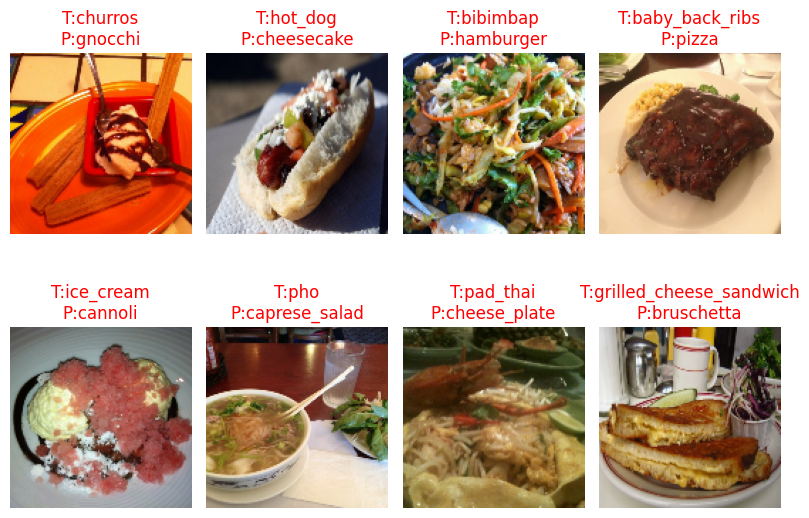

In [ ]:
#  Mostrar algunas predicciones
x_val, y_val = next(iter(val_ds))
idxs = random.sample(range(x_val.shape[0]), 8)
fig, axes = plt.subplots(2,4, figsize=(8,6))
for ax, i in zip(axes.flatten(), idxs):
    img = x_val[i].numpy().astype("uint8")
    t   = classes[np.argmax(y_val[i])]
    p   = classes[y_pred[i]]
    ax.imshow(img)
    ax.set_title(f"T:{t}\nP:{p}", color=("green" if t==p else "red"))
    ax.axis("off")
plt.tight_layout()
plt.show()


#VAMOS A HACER LA PRUBEBA CON APROXIMADAMENTE EL 5% DE LOS DATOS.

##Tiempo de ejecución 3.22 minutos aprox

Clases usadas: ['apple_pie', 'baby_back_ribs', 'baklava', 'beef_carpaccio', 'beef_tartare', 'beet_salad', 'beignets', 'bibimbap', 'bread_pudding', 'breakfast_burrito', 'bruschetta', 'caesar_salad', 'cannoli', 'caprese_salad', 'carrot_cake', 'ceviche', 'cheese_plate', 'cheesecake', 'chicken_curry', 'chicken_quesadilla', 'chicken_wings', 'chocolate_cake', 'chocolate_mousse', 'churros', 'clam_chowder', 'club_sandwich', 'crab_cakes', 'creme_brulee', 'croque_madame', 'cup_cakes', 'deviled_eggs', 'donuts', 'dumplings', 'edamame', 'eggs_benedict', 'escargots', 'falafel', 'filet_mignon', 'fish_and_chips', 'foie_gras']
Found 40000 files belonging to 40 classes.
Using 2000 files for training.
Usando 62/125 batches para entrenamiento
Usando 63/125 batches para validación


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_1 (TrueDivide)      │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract_1 (Subtract)           │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_128            │ (None, 1280)           │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 40)             │        51,240 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,314,344 (8.83 MB)

 Trainable params: 53,800 (210.16 KB)

 Non-trainable params: 2,260,544 (8.62 MB)

Epoch 1/8
61/62 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - accuracy: 0.0410 - loss: 4.6743 - precision: 0.0319 - recall: 0.0039

62/62 ━━━━━━━━━━━━━━━━━━━━ 22s 179ms/step - accuracy: 0.0418 - loss: 4.6650 - precision: 0.0344 - recall: 0.0042 - val_accuracy: 0.1974 - val_loss: 3.1840 - val_precision: 0.6429 - val_recall: 0.0179 - learning_rate: 0.0010
Epoch 2/8
61/62 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - accuracy: 0.2999 - loss: 3.0294 - precision: 0.4679 - recall: 0.1096

62/62 ━━━━━━━━━━━━━━━━━━━━ 13s 139ms/step - accuracy: 0.2997 - loss: 3.0306 - precision: 0.4692 - recall: 0.1100 - val_accuracy: 0.3244 - val_loss: 2.7667 - val_precision: 0.6780 - val_recall: 0.0794 - learning_rate: 0.0010
Epoch 3/8
61/62 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - accuracy: 0.4057 - loss: 2.4824 - precision: 0.6600 - recall: 0.2221

62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - accuracy: 0.4057 - loss: 2.4838 - precision: 0.6600 - recall: 0.2219 - val_accuracy: 0.3740 - val_loss: 2.6360 - val_precision: 0.6715 - val_recall: 0.1379 - learning_rate: 0.0010
Epoch 4/8
61/62 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.5273 - loss: 2.1171 - precision: 0.7761 - recall: 0.3218

62/62 ━━━━━━━━━━━━━━━━━━━━ 15s 179ms/step - accuracy: 0.5264 - loss: 2.1216 - precision: 0.7746 - recall: 0.3213 - val_accuracy: 0.4028 - val_loss: 2.5764 - val_precision: 0.6562 - val_recall: 0.2083 - learning_rate: 0.0010
Epoch 5/8
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.5869 - loss: 1.9422 - precision: 0.7810 - recall: 0.3617

62/62 ━━━━━━━━━━━━━━━━━━━━ 11s 183ms/step - accuracy: 0.5864 - loss: 1.9442 - precision: 0.7809 - recall: 0.3617 - val_accuracy: 0.4167 - val_loss: 2.5645 - val_precision: 0.6540 - val_recall: 0.2381 - learning_rate: 0.0010
Epoch 6/8
62/62 ━━━━━━━━━━━━━━━━━━━━ 11s 167ms/step - accuracy: 0.6250 - loss: 1.8129 - precision: 0.8144 - recall: 0.4432 - val_accuracy: 0.4226 - val_loss: 2.5691 - val_precision: 0.6324 - val_recall: 0.2560 - learning_rate: 0.0010
Epoch 7/8
62/62 ━━━━━━━━━━━━━━━━━━━━ 17s 108ms/step - accuracy: 0.6746 - loss: 1.6607 - precision: 0.8519 - recall: 0.4962 - val_accuracy: 0.4187 - val_loss: 2.5951 - val_precision: 0.6116 - val_recall: 0.2609 - learning_rate: 0.0010
Epoch 8/8
62/62 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - accuracy: 0.7133 - loss: 1.5948 - precision: 0.8519 - recall: 0.5765 - val_accuracy: 0.4266 - val_loss: 2.6055 - val_precision: 0.6182 - val_recall: 0.2698 - learning_rate: 5.0000e-04
Epoch 1/8
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - accuracy: 0.4501 - 

62/62 ━━━━━━━━━━━━━━━━━━━━ 33s 229ms/step - accuracy: 0.4503 - loss: 2.3784 - precision: 0.6561 - recall: 0.2898 - val_accuracy: 0.4077 - val_loss: 2.5199 - val_precision: 0.6683 - val_recall: 0.2659 - learning_rate: 1.0000e-04
Epoch 2/8
62/62 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - accuracy: 0.5932 - loss: 1.9268 - precision: 0.7915 - recall: 0.4186 - val_accuracy: 0.3968 - val_loss: 2.5628 - val_precision: 0.6341 - val_recall: 0.2768 - learning_rate: 1.0000e-04
Epoch 3/8
62/62 ━━━━━━━━━━━━━━━━━━━━ 9s 137ms/step - accuracy: 0.6836 - loss: 1.6934 - precision: 0.8539 - recall: 0.4777 - val_accuracy: 0.4137 - val_loss: 2.5711 - val_precision: 0.6154 - val_recall: 0.2857 - learning_rate: 1.0000e-04
Epoch 4/8
62/62 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - accuracy: 0.6921 - loss: 1.5939 - precision: 0.8659 - recall: 0.5313 - val_accuracy: 0.4226 - val_loss: 2.5755 - val_precision: 0.6066 - val_recall: 0.2907 - learning_rate: 5.0000e-05


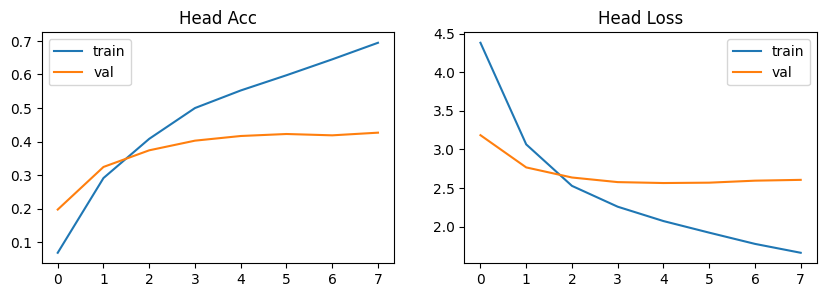

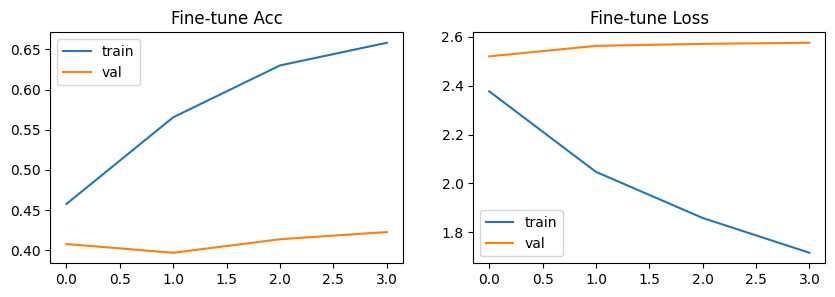

63/63 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step


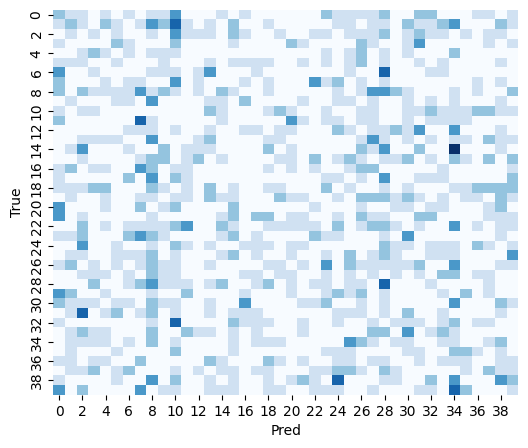

                    precision    recall  f1-score   support

         apple_pie     0.0541    0.0714    0.0615        28
    baby_back_ribs     0.0833    0.0526    0.0645        38
           baklava     0.0000    0.0000    0.0000        29
    beef_carpaccio     0.0000    0.0000    0.0000        19
      beef_tartare     0.0526    0.0625    0.0571        16
        beet_salad     0.0588    0.0526    0.0556        19
          beignets     0.0000    0.0000    0.0000        19
          bibimbap     0.0323    0.0476    0.0385        21
     bread_pudding     0.0189    0.0286    0.0227        35
 breakfast_burrito     0.0000    0.0000    0.0000        18
        bruschetta     0.0000    0.0000    0.0000        26
      caesar_salad     0.0000    0.0000    0.0000        21
           cannoli     0.0000    0.0000    0.0000        24
     caprese_salad     0.0741    0.0800    0.0769        25
       carrot_cake     0.0000    0.0000    0.0000        27
           ceviche     0.0000    0.0000

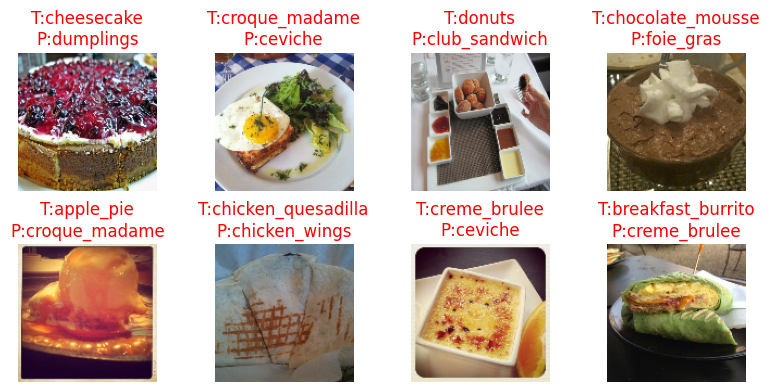

In [2]:
# ── Instala dependencias ─────────────────────────────────────────────────────────
!pip install --quiet kagglehub seaborn

import os, zipfile, random
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf
from tensorflow.keras import layers, models, callbacks, metrics
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import confusion_matrix, classification_report
from kagglehub import dataset_download


dataset_path = dataset_download("kmader/food41")
if dataset_path.endswith(".zip"):
    with zipfile.ZipFile(dataset_path, "r") as z:
        z.extractall("food41")
    root = "food41"
else:
    root = dataset_path
images_dir = os.path.join(root, "images")

#  Selección de las clases ─────────────────────────────────────────────────────
classes = sorted(os.listdir(images_dir))[:40]
print("Clases usadas:", classes)

# Parámetros para la prueba
BATCH_SIZE = 16
IMG_SIZE   = (128, 128)

#  Reducimos un dataset pequeño
# Usamos validation_split=0.95 para que 'training' tome el 5% restante
small_ds = tf.keras.preprocessing.image_dataset_from_directory(
    images_dir,
    labels="inferred",
    label_mode="categorical",
    class_names=classes,
    validation_split=0.95,
    subset="training",
    seed=42,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

#  Particionar
total_batches = small_ds.cardinality().numpy()
train_batches = total_batches // 2
val_batches   = total_batches - train_batches

train_ds = small_ds.take(train_batches)
val_ds   = small_ds.skip(train_batches).take(val_batches)

print(f"Usando {train_batches}/{total_batches} batches para entrenamiento")
print(f"Usando {val_batches}/{total_batches} batches para validación")


data_augment = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
])

AUTOTUNE = tf.data.AUTOTUNE
train_ds = (
    train_ds
    .map(lambda x,y: (data_augment(x, training=True), y), num_parallel_calls=AUTOTUNE)
    .prefetch(1)
)
val_ds = val_ds.prefetch(1)

#  Cálculo de class weights
y_train = np.concatenate([y.numpy() for _,y in train_ds], axis=0)
labels = np.argmax(y_train, axis=1)
cw = compute_class_weight("balanced", classes=np.unique(labels), y=labels)
class_weights = dict(enumerate(cw))

#  Definir modelo ligero: MobileNetV2
base = tf.keras.applications.MobileNetV2(
    input_shape=(*IMG_SIZE,3), include_top=False, weights="imagenet", pooling="avg"
)
base.trainable = False

inputs = layers.Input((*IMG_SIZE,3))
x = tf.keras.applications.mobilenet_v2.preprocess_input(inputs)
x = base(x, training=False)
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.4)(x)
outputs = layers.Dense(len(classes), activation="softmax")(x)

model = models.Model(inputs, outputs)
model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-3),
    loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.1),
    metrics=[
        "accuracy",
        metrics.Precision(name="precision"),
        metrics.Recall(name="recall")
    ]
)
model.summary()

#  Callbacks
es  = callbacks.EarlyStopping(monitor="val_loss", patience=3, restore_best_weights=True)
mc  = callbacks.ModelCheckpoint("best.h5", save_best_only=True)
rlp = callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=2, min_lr=1e-6)


history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=8,
    class_weight=class_weights,
    callbacks=[es, mc, rlp]
)

#  Fine-tuning parcial
base.trainable = True
for layer in base.layers[:-20]:
    layer.trainable = False

model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.1),
    metrics=["accuracy", metrics.Precision(), metrics.Recall()]
)

history_ft = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=8,
    class_weight=class_weights,
    callbacks=[es, mc, rlp]
)

#  Graficar curvas
def plot_hist(h, title):
    plt.figure(figsize=(10,3))
    plt.subplot(1,2,1)
    plt.plot(h.history["accuracy"], label="train")
    plt.plot(h.history["val_accuracy"], label="val")
    plt.title(f"{title} Acc"); plt.legend()
    plt.subplot(1,2,2)
    plt.plot(h.history["loss"], label="train")
    plt.plot(h.history["val_loss"], label="val")
    plt.title(f"{title} Loss"); plt.legend()
    plt.show()

plot_hist(history,    "Head")
plot_hist(history_ft, "Fine-tune")

# Evaluación rapida + matriz de confusion
y_pred = np.argmax(model.predict(val_ds), axis=1)
y_true = np.concatenate([np.argmax(y.numpy(),1) for _,y in val_ds])

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm, fmt="d", cbar=False, cmap="Blues")
plt.xlabel("Pred"); plt.ylabel("True")
plt.show()

print(classification_report(y_true, y_pred, target_names=classes, digits=4))

# Mostramos algunas predicciones
x_val, y_val = next(iter(val_ds))
idxs = random.sample(range(x_val.shape[0]), 8)
fig, axes = plt.subplots(2,4, figsize=(8,4))
for ax,i in zip(axes.flatten(), idxs):
    img = x_val[i].numpy().astype("uint8")
    t   = classes[np.argmax(y_val[i])]
    p   = classes[y_pred[i]]
    ax.imshow(img)
    ax.set_title(f"T:{t}\nP:{p}", color=("green" if t==p else "red"))
    ax.axis("off")
plt.tight_layout()
plt.show()
